In [1]:
from __future__ import division, print_function
import os, glob, matplotlib.pyplot as plt, numpy as np, pandas as pd, math, re
%load_ext autoreload
%autoreload 2
np.set_printoptions(precision=6, suppress=True)
#%matplotlib notebook
%matplotlib inline

In [2]:
df, grad = {}, {}
duration, subjects, levels = [], [], []

for file in glob.glob(os.path.join('..', 'datadir', 'pilot', '*csv')):
    df_ = pd.read_csv(file, '\t')

    _, fname = os.path.split(file)
    fname, ext = fname.split('.')
    date, time, _, level, subj = fname.split('_')
    print('Gathering data for', subj, 'at ', level)

    if subj not in subjects:
        subjects.append(subj)
    if level not in levels:
        levels.append(level)

    try:
        df[subj][level] = {}
        grad[subj][level] = {}
    except:
        df[subj] = {}
        df[subj][level] = {}
        grad[subj] = {}
        grad[subj][level] = {}

    for axis in ['T', 'X', 'Y']:
        for obj in ['gaze', 'ball', 'paddle']:
            df[subj][level][axis+obj] = df_[axis+obj]

    duration.append(float(str(round(df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0],3)))) # retrieve the lengths of the levels

    """ Gradients """
    N_start, N_stop = 0, int((df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0])*30)

    # find the moment when the ball collide with an element from below
    grad_, value_old, value_older = [], 0, 0
    for k, value in enumerate(np.gradient(df[subj][level]['Yball'])[N_start:N_stop]):        
        if value > 0 and  value_older < 0:
            grad_.append(k)
                
        value_older = value_old
        value_old = value
        
    grad[subj][level] = grad_

print("Duration per level (in seconds) = " + str(duration))
print("Total duration = " + str(round(sum(duration)/60, 2)) + " min")

Gathering data for juliette at  lvl1
Gathering data for juliette at  lvl2
Gathering data for juliette at  lvl3
Gathering data for juliette at  lvl4
Gathering data for juliette at  lvl5
Gathering data for juliette at  lvl6
Gathering data for remi at  lvl1
Gathering data for remi at  lvl2
Gathering data for remi at  lvl3
Gathering data for remi at  lvl4
Gathering data for remi at  lvl5
Gathering data for remi at  lvl6
Gathering data for valerie at  lvl1
Gathering data for valerie at  lvl2
Gathering data for valerie at  lvl3
Gathering data for valerie at  lvl4
Gathering data for valerie at  lvl5
Gathering data for valerie at  lvl6
Gathering data for elisa at  lvl1
Gathering data for elisa at  lvl2
Gathering data for elisa at  lvl3
Gathering data for elisa at  lvl4
Gathering data for elisa at  lvl5
Gathering data for elisa at  lvl6
Gathering data for maxime at  lvl1
Gathering data for maxime at  lvl2
Gathering data for maxime at  lvl3
Gathering data for maxime at  lvl4
Gathering data for m

juliette
lvl1


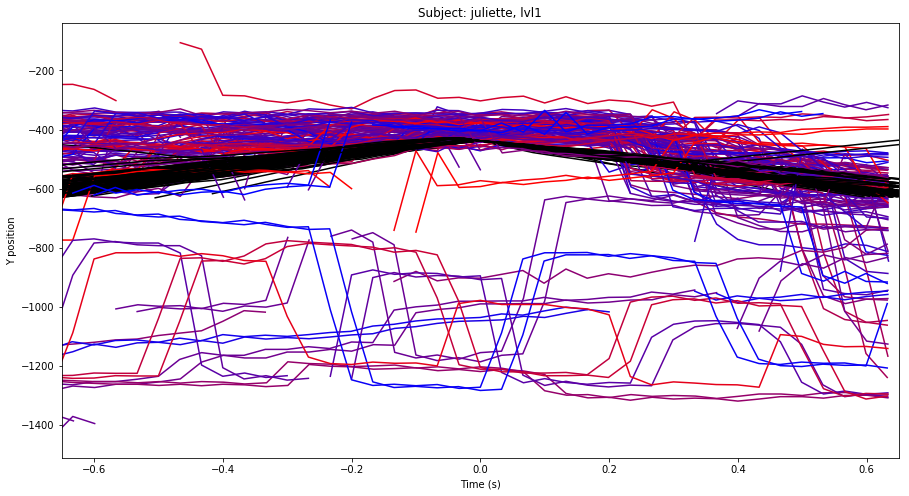

lvl2


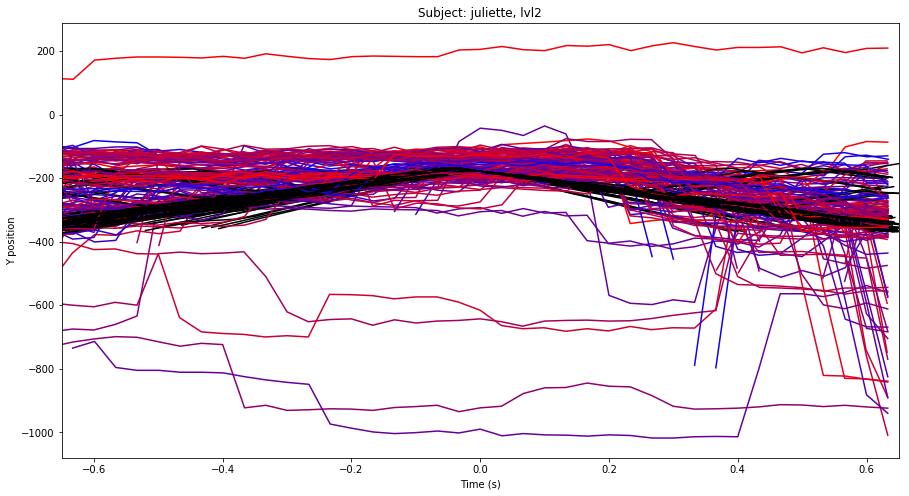

lvl3


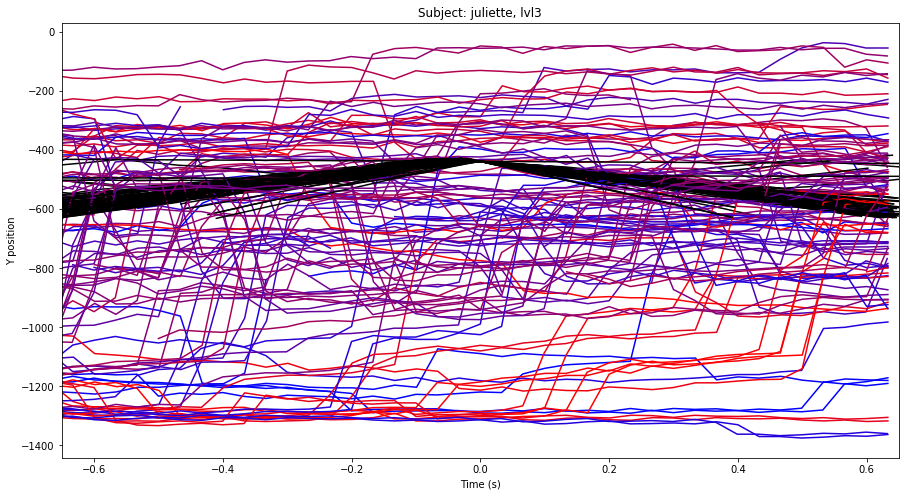

lvl4


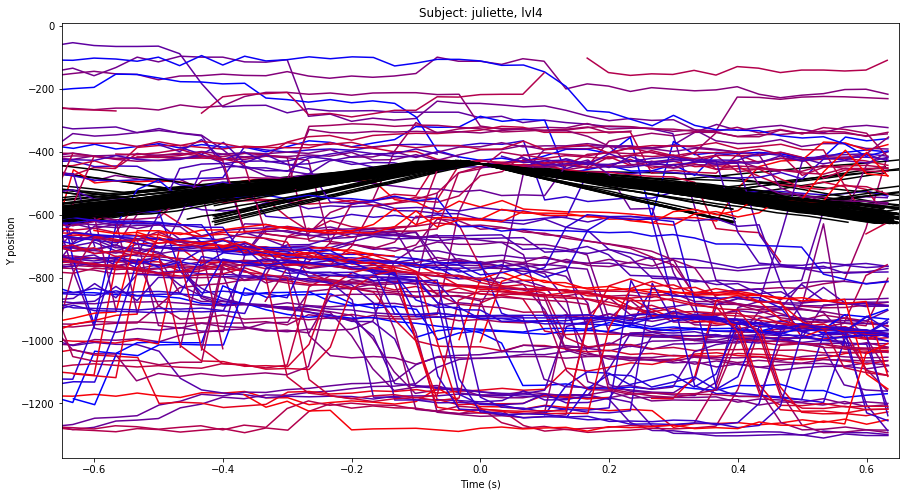

lvl5


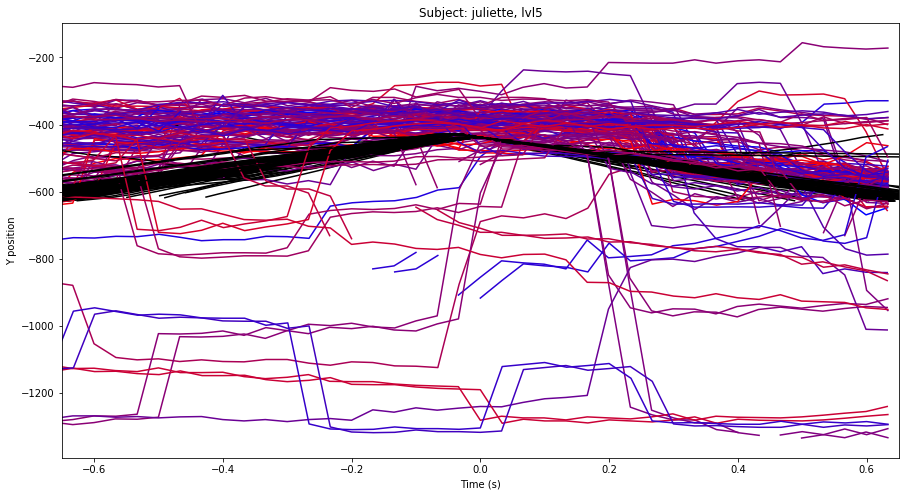

lvl6


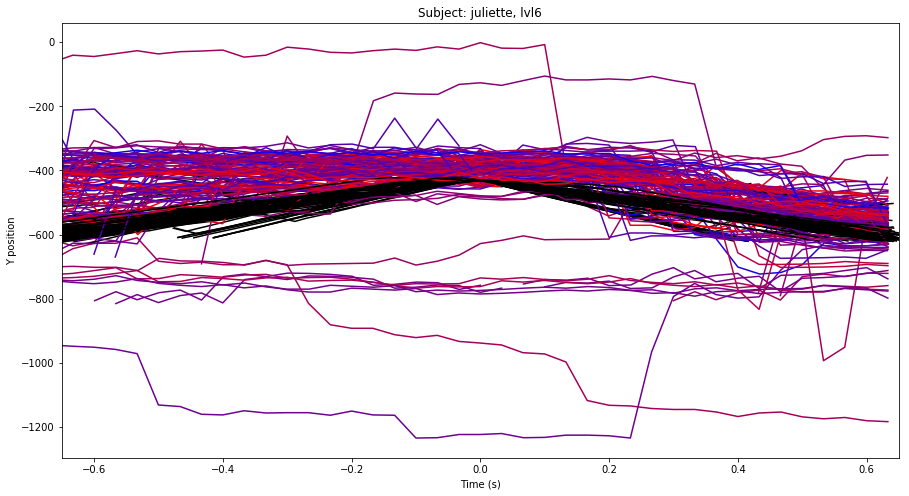

remi
lvl1


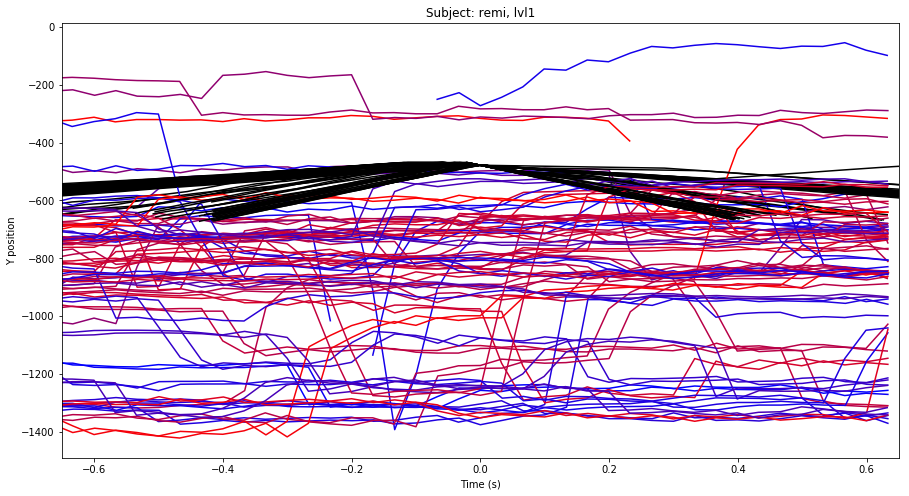

lvl2


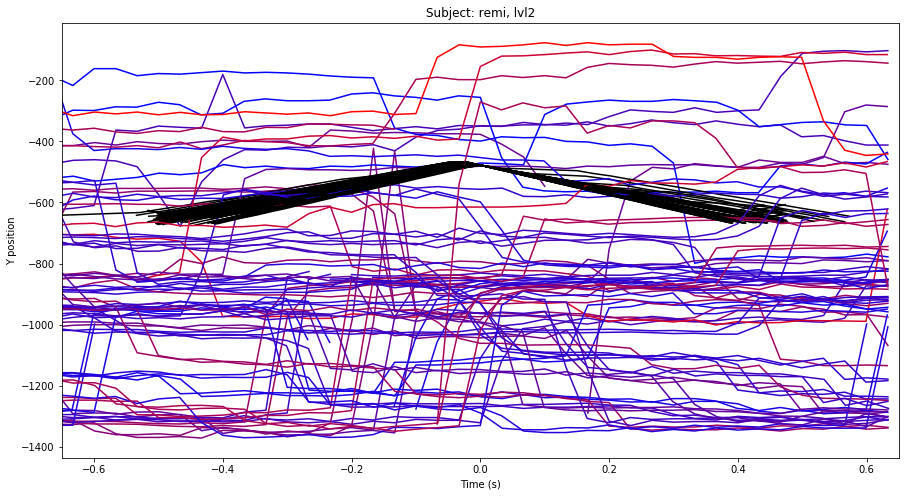

lvl3


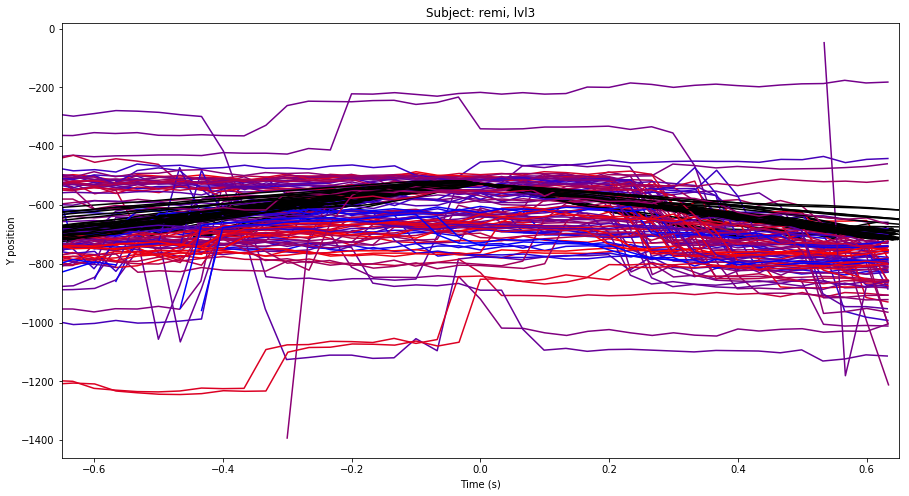

lvl4


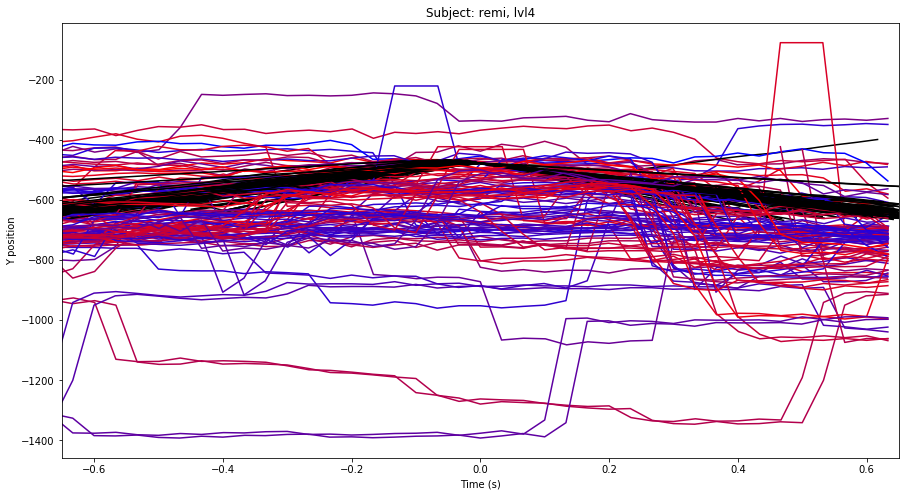

lvl5


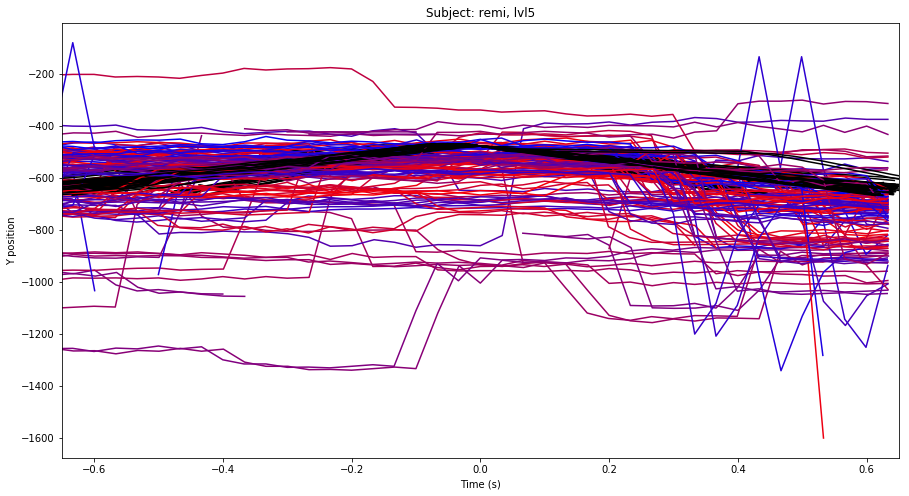

lvl6


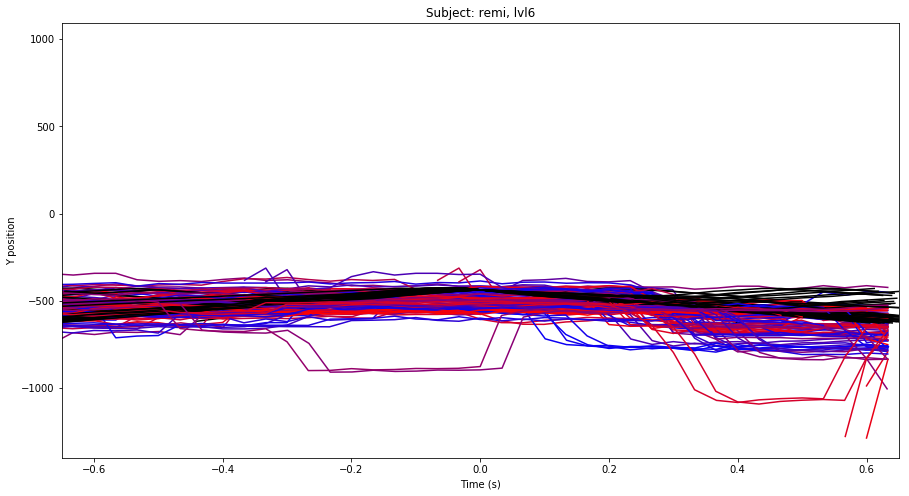

valerie
lvl1


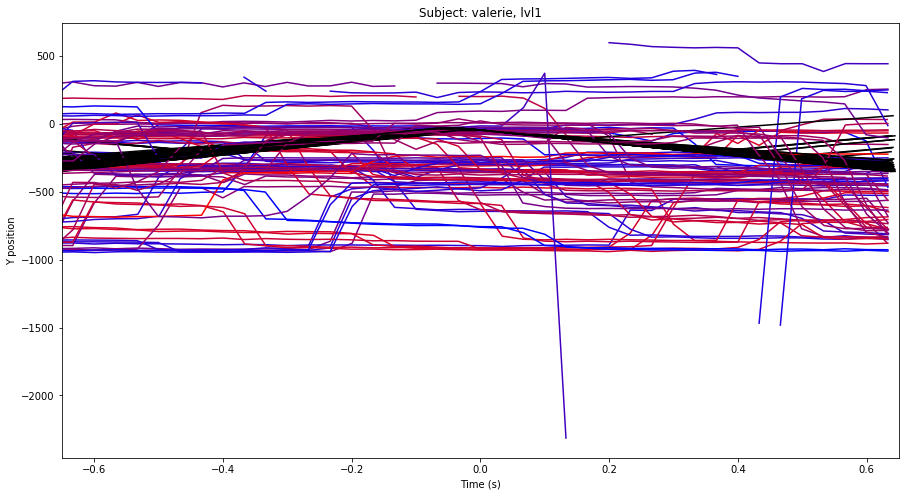

lvl2


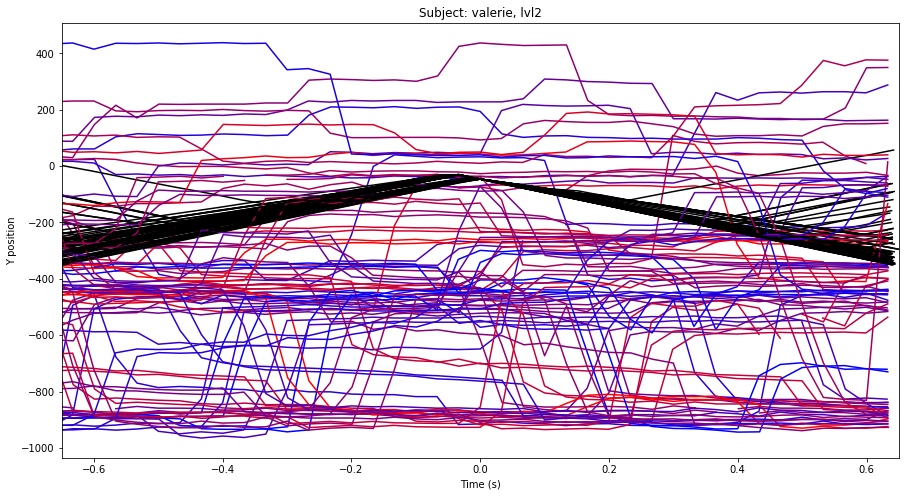

lvl3


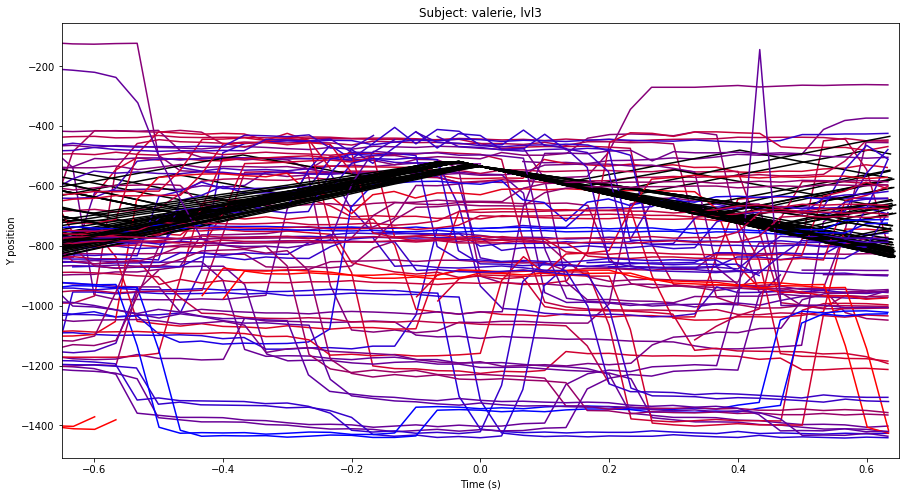

lvl4


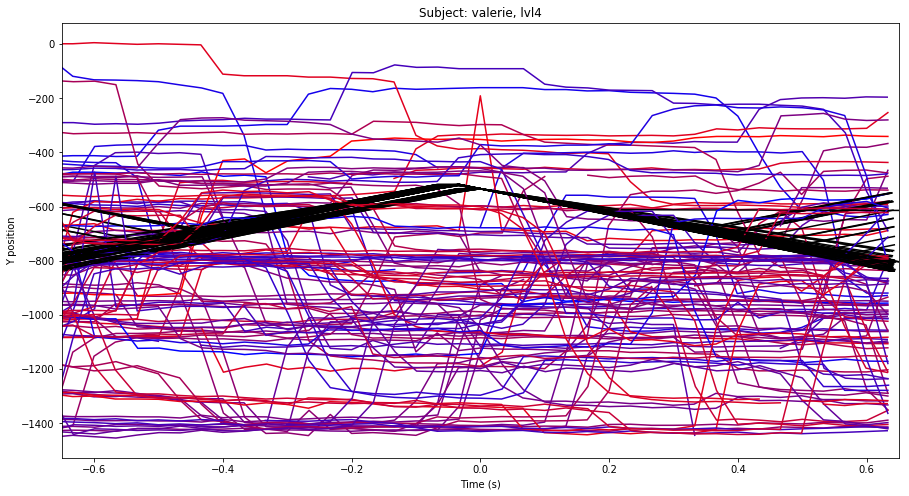

lvl5


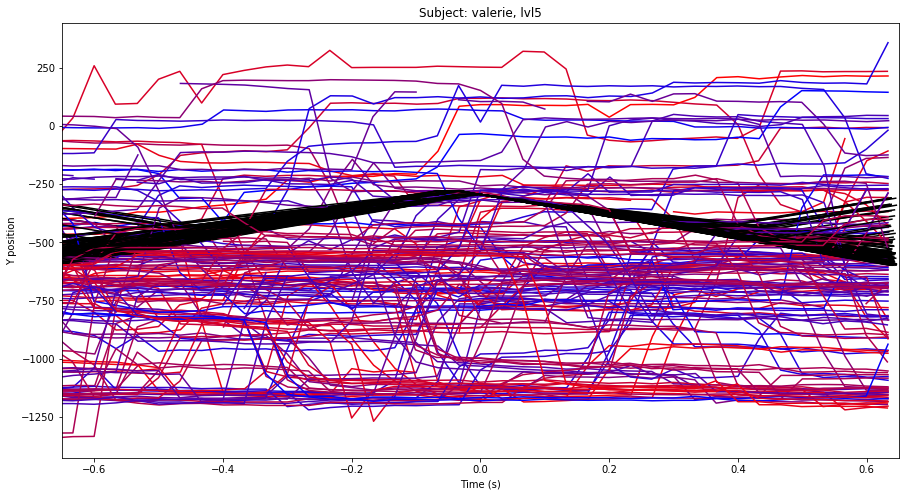

lvl6


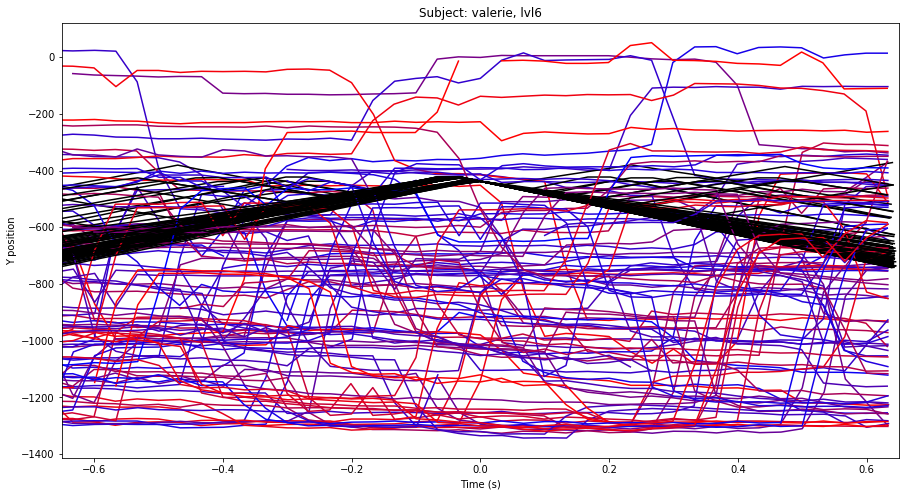

elisa
lvl1


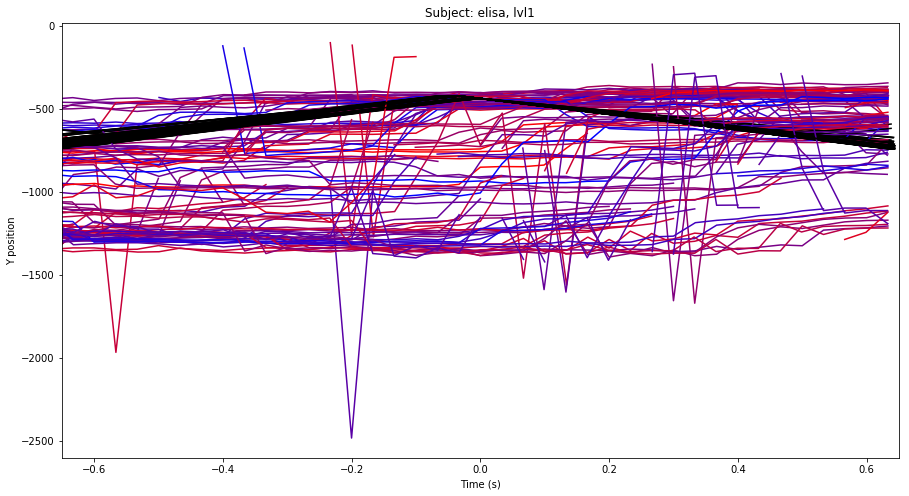

lvl2


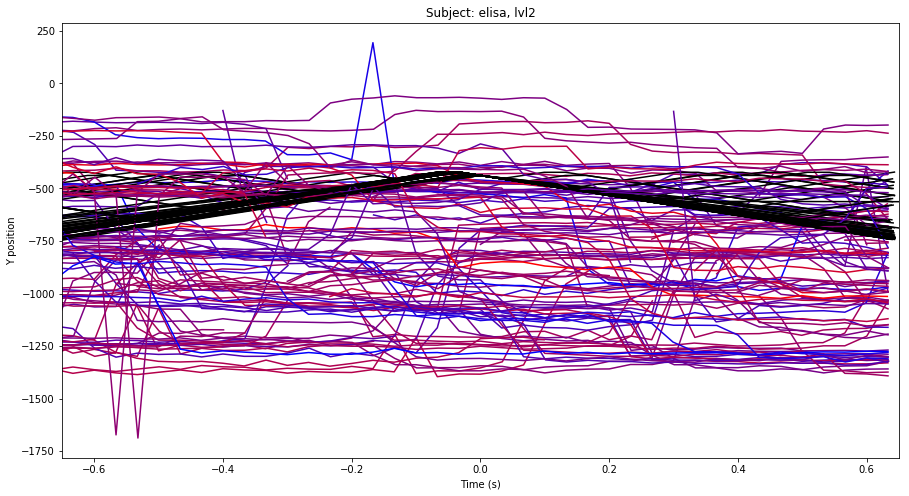

lvl3


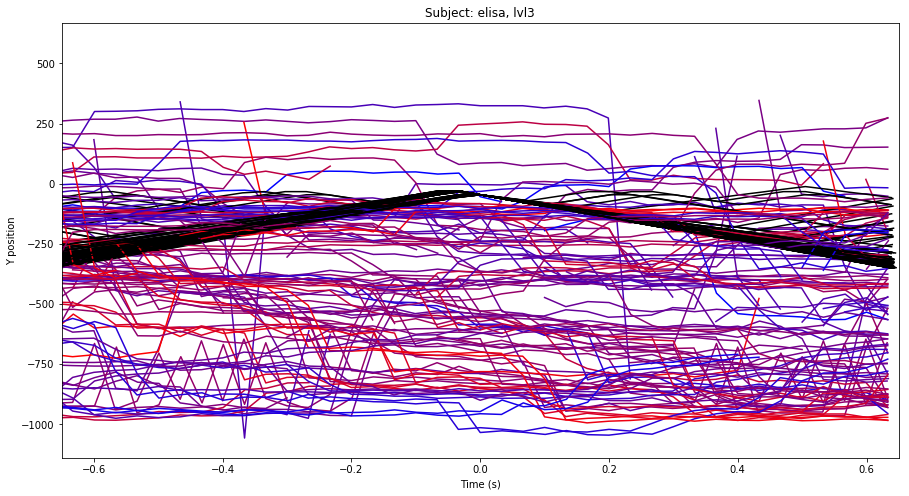

lvl4


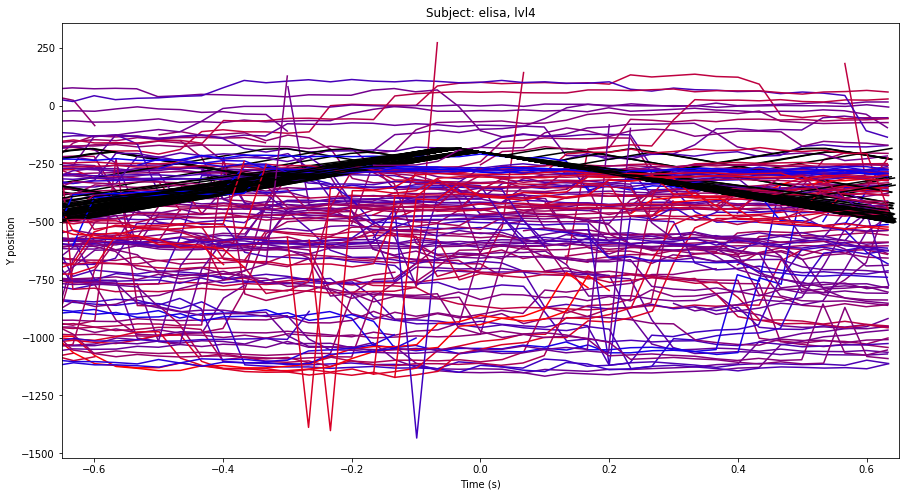

lvl5


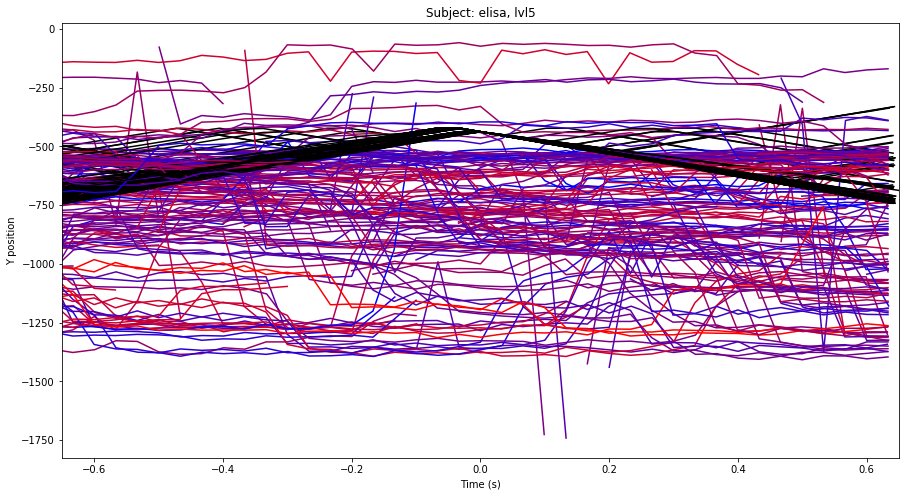

lvl6


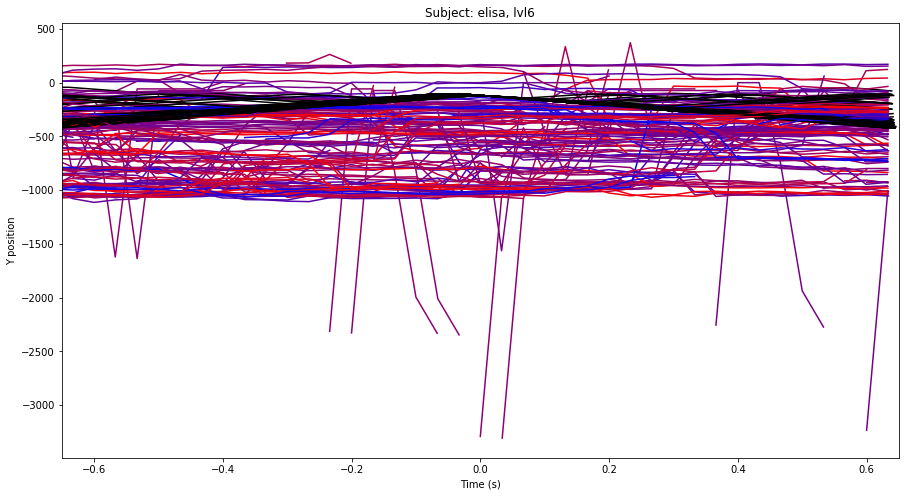

maxime
lvl1


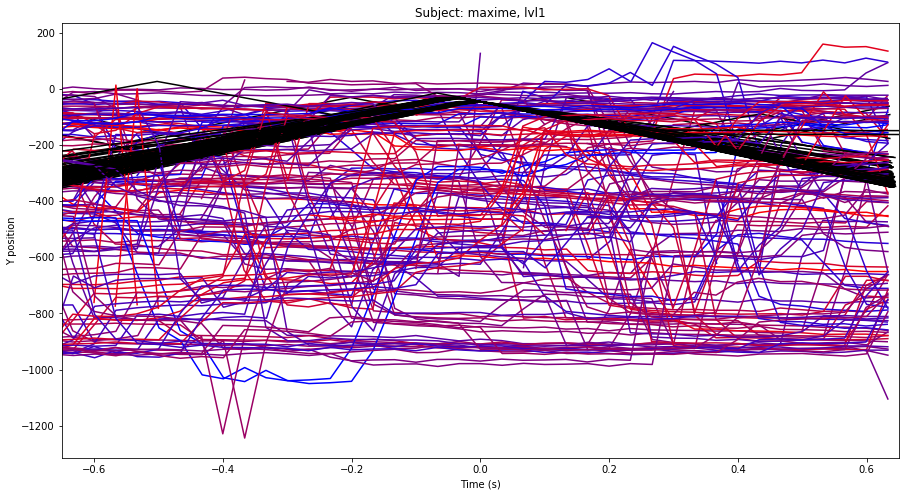

lvl2


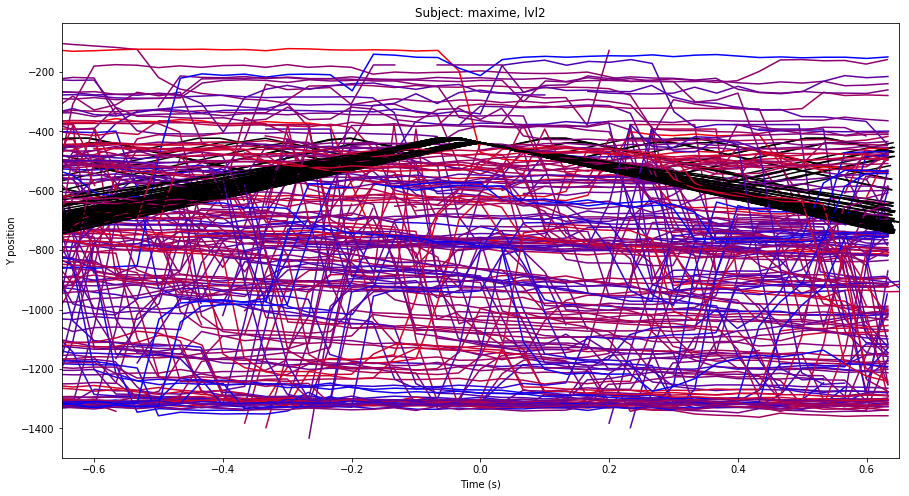

lvl3


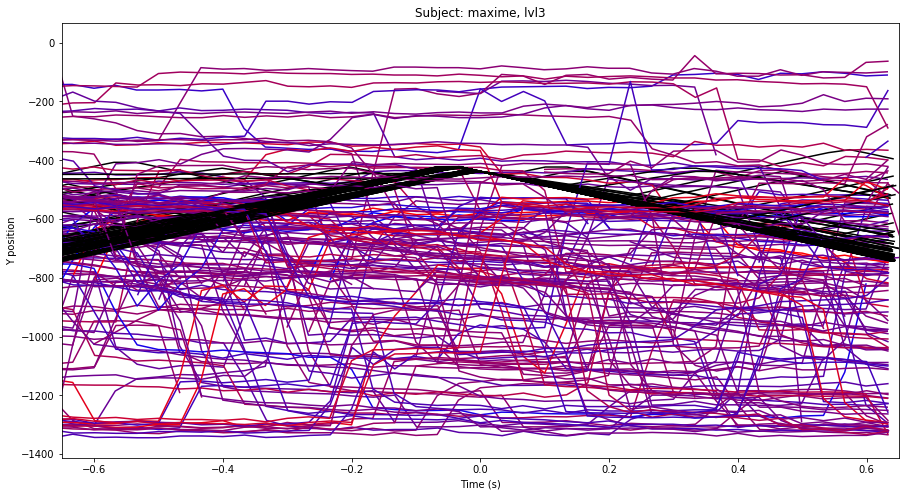

lvl4


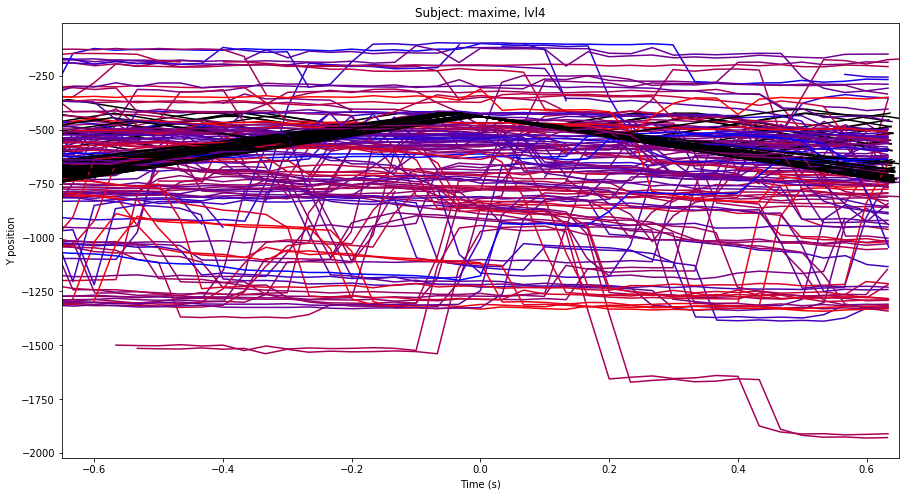

lvl5


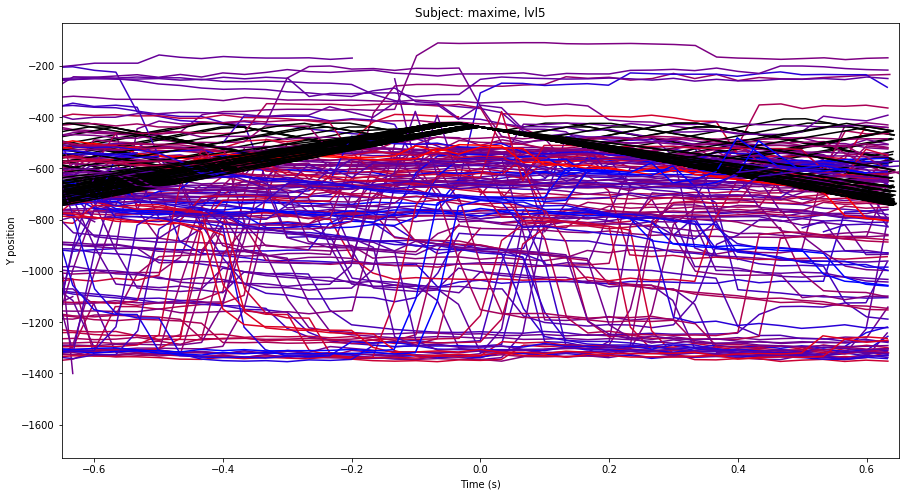

lvl6


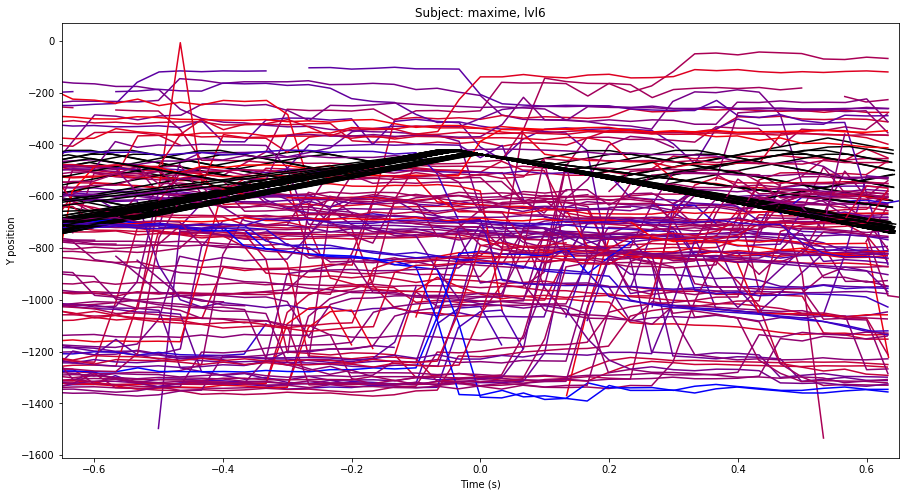

jade
lvl1


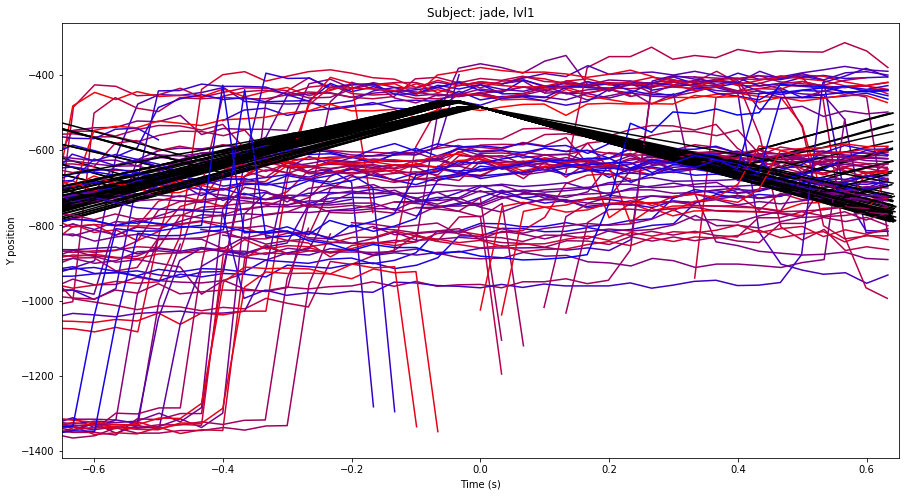

lvl2


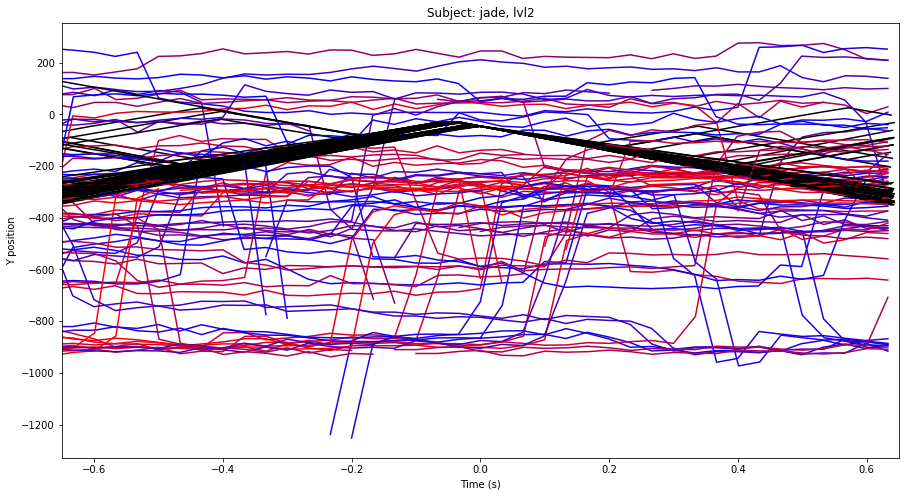

lvl3


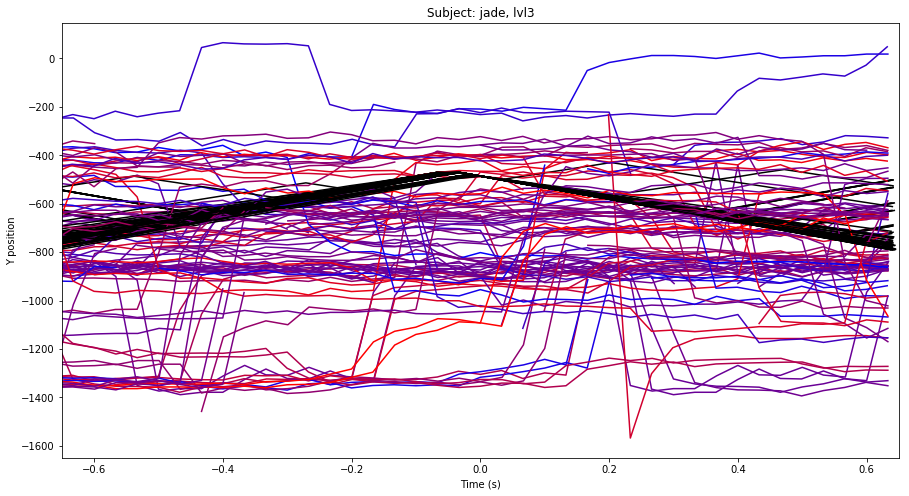

lvl4


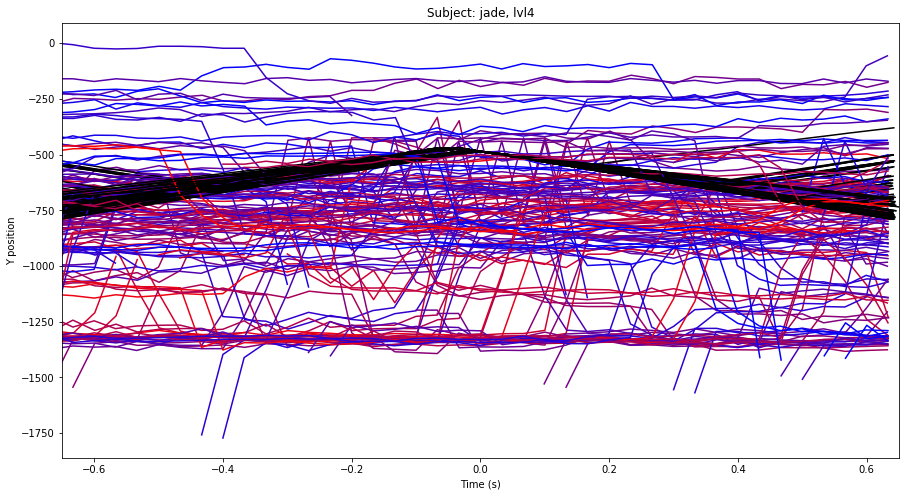

lvl5


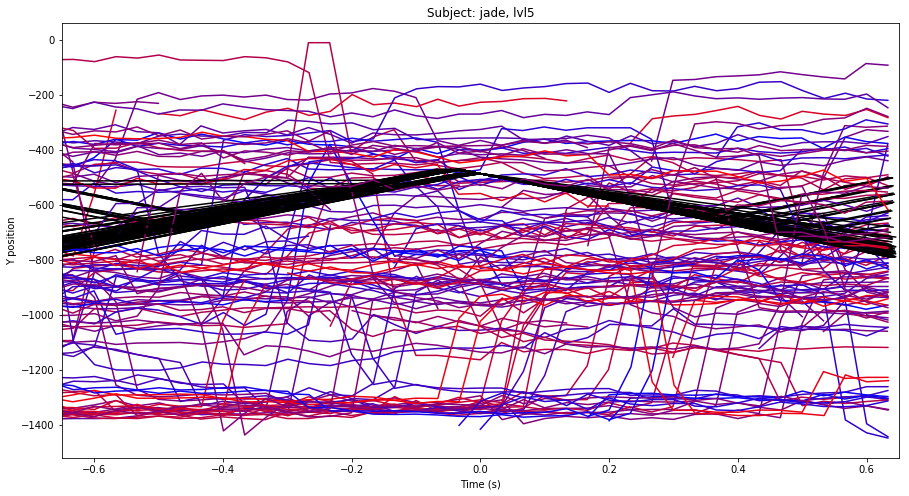

lvl6


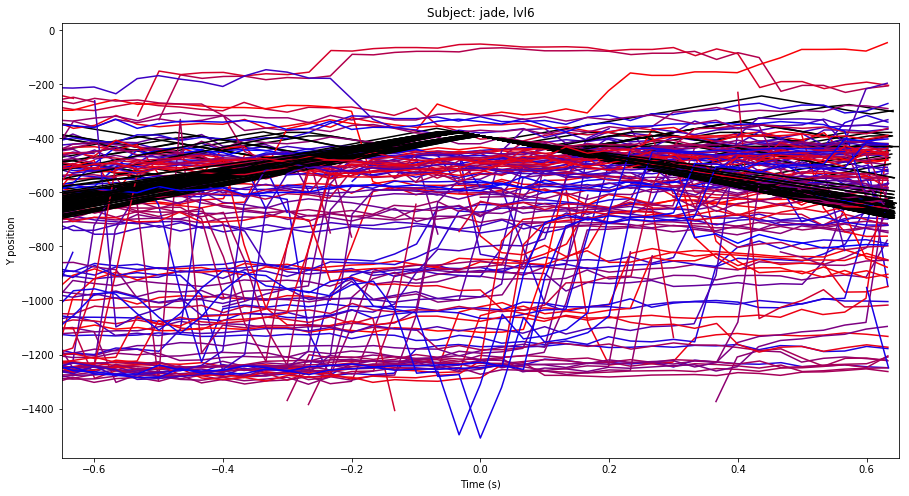

In [17]:
deltav = 20
for subj in subjects:
    print(subj)
    for level in levels:
        print(level)
        grad_h_abs = []
        for v in grad[subj][level]:
            grad_h_abs.append(df[subj][level]['Xball'][v+1] - df[subj][level]['Xball'][v-1])

        grad_h = np.array(grad_h_abs)
        grad_h -= grad_h.min() # valeur min fixée à 0
        grad_h /= grad_h.max() # normalisation entre 0 et 1

        fig, ax = plt.subplots(figsize=(15,8))
        for v, g_h, g_h_abs in zip(grad[subj][level], grad_h, grad_h_abs):
            if df[subj][level]['Yball'][v] > 25:
                c = [1-g_h, 0, g_h]
                diff = df[subj][level]['Yball'][grad[subj][level][0]] - df[subj][level]['Yball'][v]
                ax.plot(df[subj][level]['Tgaze'][v-deltav:v+deltav]-df[subj][level]['Tgaze'][v], -np.array(df[subj][level]['Ygaze'][v-deltav:v+deltav]) - diff, c=c, label='%0.3f' % g_h_abs)
                ax.plot(df[subj][level]['Tpaddle'][v-deltav:v+deltav]-df[subj][level]['Tpaddle'][v], -np.array(df[subj][level]['Yball'][v-deltav:v+deltav]) - diff, 'k')

                ax.set_title('Subject: %s, %s' %(subj, level))
                ax.set_ylabel('Y position')
                ax.set_xlabel('Time (s)')
                ax.set_xlim(-0.65, 0.65)
                #ax.legend(loc='center left')
        plt.show()

In [52]:
lvls_mix = [[[1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1],
         [1, 1, 1, 1, 1, 1, 1, 1, 1]],

        [[1, 1, 1, 1, 1, 1, 1, 5, 1],
         [1, 5, 1, 5, 1, 5, 5, 5, 5],
         [5, 5, 1, 5, 1, 5, 1, 5, 5],
         [5, 1, 1, 5, 0, 1, 5, 5, 1],
         [5, 1, 5, 1, 5, 1, 1, 1, 1],
         [5, 1, 1, 5, 5, 5, 5, 1, 1],
         [5, 1, 5, 1, 5, 5, 5, 1, 1],
         [5, 5, 5, 5, 1, 1, 1, 5, 1],
         [1, 1, 5, 5, 1, 5, 5, 1, 5]],

        [[5, 1, 5, 5, 1, 5, 1, 3, 1],
         [1, 3, 5, 3, 5, 3, 3, 3, 3],
         [3, 3, 1, 3, 1, 3, 5, 3, 3],
         [3, 1, 5, 3, 0, 1, 3, 3, 1],
         [3, 5, 3, 1, 3, 1, 1, 5, 1],
         [3, 1, 5, 3, 3, 3, 3, 1, 5],
         [3, 5, 3, 5, 3, 3, 3, 1, 5],
         [3, 3, 3, 3, 5, 5, 1, 3, 5],
         [1, 5, 3, 3, 5, 3, 3, 1, 3]],

        [[2, 2, 2, 2, 2, 2, 2, 4, 2],
         [2, 4, 2, 4, 2, 4, 4, 4, 4],
         [4, 4, 2, 4, 2, 4, 2, 4, 4],
         [4, 2, 2, 4, 0, 2, 4, 4, 2],
         [4, 2, 4, 2, 4, 2, 2, 2, 2],
         [4, 2, 2, 4, 4, 4, 4, 2, 2],
         [4, 2, 4, 2, 4, 4, 4, 2, 2],
         [4, 4, 4, 4, 2, 2, 2, 4, 2],
         [2, 2, 4, 4, 2, 4, 4, 2, 4]],

        [[2, 1, 2, 2, 1, 2, 1, 4, 1],
         [1, 3, 2, 4, 2, 4, 3, 4, 4],
         [3, 3, 1, 4, 1, 3, 2, 4, 3],
         [3, 1, 2, 3, 0, 1, 3, 3, 1],
         [4, 2, 3, 1, 4, 1, 1, 2, 1],
         [4, 1, 2, 4, 3, 3, 4, 1, 2],
         [3, 2, 3, 2, 3, 4, 3, 1, 2],
         [4, 3, 4, 4, 2, 2, 1, 3, 2],
         [1, 2, 4, 4, 2, 4, 4, 1, 3]],

        [[2, 1, 2, 2, 2, 2, 1, 5, 1],
         [1, 4, 3, 5, 3, 5, 3, 5, 4],
         [4, 3, 1, 5, 1, 3, 3, 4, 3],
         [4, 2, 3, 4, 0, 1, 4, 4, 2],
         [5, 2, 3, 1, 5, 1, 2, 3, 1],
         [5, 1, 3, 5, 4, 3, 5, 1, 2],
         [3, 2, 4, 2, 3, 5, 4, 1, 3],
         [5, 4, 4, 5, 3, 2, 1, 4, 2],
         [1, 2, 5, 5, 2, 4, 5, 1, 4]]]

lvls_mono = [[[0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 1, 1, 1, 1, 1, 1],
              [1, 1, 1, 0, 0, 0, 1, 1, 1]],

             [[0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 2, 2, 2, 2, 2, 2],
              [2, 2, 2, 0, 0, 0, 2, 2, 2]],

             [[0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 3, 3, 3, 3, 3, 3],
              [3, 3, 3, 0, 0, 0, 3, 3, 3]],

             [[0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 4, 4, 4, 4, 4, 4],
              [4, 4, 4, 0, 0, 0, 4, 4, 4]],

             [[0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 0, 0, 0, 0],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 5, 5, 5, 5, 5, 5],
              [5, 5, 5, 0, 0, 0, 5, 5, 5]],

             [[2, 1, 2, 2, 2, 2, 1, 5, 1],
              [1, 4, 3, 5, 3, 5, 3, 5, 4],
              [4, 3, 1, 5, 1, 3, 3, 4, 3],
              [4, 2, 3, 4, 0, 1, 4, 4, 2],
              [5, 2, 3, 1, 5, 1, 2, 3, 1],
              [5, 1, 3, 5, 4, 3, 5, 1, 2],
              [3, 2, 4, 2, 3, 5, 4, 1, 3],
              [5, 4, 4, 5, 3, 2, 1, 4, 2],
              [1, 2, 5, 5, 2, 4, 5, 1, 4]]]

In [4]:
"""deltav = 40
for subj in subjects:
    print("Subject: ", subj)
    for level in levels:
        print(level)
        for v in grad[subj][level]:
            fig, ax = plt.subplots(figsize=(15,8))
            try:
                ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v-deltav:v+deltav])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v-deltav:v+deltav])**2), 'g')
                ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v])**2), 'r')
                ax.plot([0, 0], [0, 800], 'k--')
            except:
                pass
            ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_ylabel('Distance')
            ax.set_xlabel('Time (s)')
            ax.set_ylim(0, 800)"""

'deltav = 40\nfor subj in subjects:\n    print("Subject: ", subj)\n    for level in levels:\n        print(level)\n        for v in grad[subj][level]:\n            fig, ax = plt.subplots(figsize=(15,8))\n            try:\n                ax.plot(df[subj][level][\'Tgaze\'][0:2*deltav]-df[subj][level][\'Tgaze\'][deltav], np.sqrt((df[subj][level][\'Ygaze\'][v-deltav:v+deltav]- df[subj][level][\'Yball\'][v-deltav:v+deltav])**2 + (df[subj][level][\'Xgaze\'][v-deltav:v+deltav]-df[subj][level][\'Xball\'][v-deltav:v+deltav])**2), \'g\')\n                ax.plot(df[subj][level][\'Tgaze\'][0:2*deltav]-df[subj][level][\'Tgaze\'][deltav], np.sqrt((df[subj][level][\'Ygaze\'][v-deltav:v+deltav]- df[subj][level][\'Yball\'][v])**2 + (df[subj][level][\'Xgaze\'][v-deltav:v+deltav]-df[subj][level][\'Xball\'][v])**2), \'r\')\n                ax.plot([0, 0], [0, 800], \'k--\')\n            except:\n                pass\n            ax.set_title(\'Subject: %s, %s\' %(subj, level))\n            ax.set_ylabel

In [93]:
deltav = 10000
t_mean, lvl, t_sacc, p, t_mean_ = {}, {}, {}, {}, []
for subj in subjects:
    print("Subject: ", subj)
    t_mean[subj], lvl[subj], p[subj] = [], [], []
    for level in levels:
        t_sacc[subj] = []
        print(level)
        for v in grad[subj][level]:
            distance = (df[subj][level]['Ygaze'][v] - df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v] - df[subj][level]['Xball'][v])**2
            distance = np.sqrt(distance)
                
            if distance < 200:
                i = v-1
                distance = (df[subj][level]['Ygaze'][v:v+deltav] - df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v:v+deltav] - df[subj][level]['Xball'][v])**2
                distance = np.sqrt(distance)
                derivate = np.diff(distance)
                if len(distance) != len(derivate):
                    derivate = np.append(derivate, np.nan)
                for x in distance:
                    i += 1
                    if derivate[i-v] > 20:
                        t_sacc[subj].append(df[subj][level]['Tgaze'][i]-df[subj][level]['Tgaze'][v])

                        if subj in ['juliette', 'elisa', 'maxime']:
                            for x, y in zip(range(len(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1])), range(len(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1]))):
                                    if x*139 < df[subj][level]['Xball'][v] < 113 + x*139 and y*45 < df[subj][level]['Yball'][v] < 42 + y*45:
                                        p[subj].append(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1][y][x])

                        if subj in ['remi', 'valerie', 'jade']:
                            for x, y in zip(range(len(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1])), range(len(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1]))):
                                    if x*139 < df[subj][level]['Xball'][v] < 113 + x*139 and y*45 < df[subj][level]['Yball'][v] < 42 + y*45:
                                        p[subj].append(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1][y][x])
                        break

        if np.std(t_sacc[subj]) < 7/10*np.mean(t_sacc[subj]):
            t_mean[subj].append(np.mean(t_sacc[subj]))
            t_mean_.append(np.mean(t_sacc[subj]))
            lvl[subj].append(re.findall(r'\d+', level)[0])
            print(np.mean(t_sacc[subj]), '+/-', np.std(t_sacc[subj]))
print(lvl)

Subject:  juliette
lvl1
0.287635443111 +/- 0.166885028949
lvl2
0.282290012836 +/- 0.163746850355
lvl3
lvl4
lvl5
0.300070683161 +/- 0.203786436431
lvl6
0.28839624153 +/- 0.165604865956
Subject:  remi
lvl1
lvl2
0.233000040054 +/- 0.066999912262
lvl3
0.25637503465 +/- 0.156374218712
lvl4
0.298323073754 +/- 0.196487391702
lvl5
0.287574746143 +/- 0.166756914361
lvl6
0.321084318391 +/- 0.199052986061
Subject:  valerie
lvl1
lvl2
0.116750061512 +/- 0.0764309993626
lvl3
0.221666653951 +/- 0.0958657195547
lvl4
0.166333119075 +/- 0.0269486020512
lvl5
lvl6
0.133199977875 +/- 0.0867442982664
Subject:  elisa
lvl1
0.483968786895 +/- 0.292323601917
lvl2
lvl3
lvl4
0.193999962373 +/- 0.122625041459
lvl5
lvl6
Subject:  maxime
lvl1
0.325731678707 +/- 0.224826478721
lvl2
lvl3
lvl4
lvl5
lvl6
Subject:  jade
lvl1
lvl2
lvl3
0.371071440833 +/- 0.194895045141
lvl4
0.190428597586 +/- 0.131983675366
lvl5
0.322333256404 +/- 0.204364558173
lvl6
{'juliette': ['1', '2', '5', '6'], 'remi': ['2', '3', '4', '5', '6'], 'v

In [76]:
deltav = 10000
p = {}
for subj in subjects:
    print("Subject: ", subj)
    p[subj] = []
    for level in levels:
        for v in grad[subj][level]:
            if subj in ['juliette', 'elisa', 'maxime']:
                for x in range(len(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1])):
                    for y in range(len(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1])):
                        if x*139 < df[subj][level]['Xball'][v] < 113 + x*139 and y*45 < df[subj][level]['Yball'][v] < 42 + y*45:
                            p[subj].append(lvls_mix[int(re.findall(r'\d+', level)[0]) - 1][y][x])

            if subj in ['remi', 'valerie', 'jade']:
                for x in range(len(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1])):
                    for y in range(len(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1])):
                        if x*139 < df[subj][level]['Xball'][v] < 113 + x*139 and y*45 < df[subj][level]['Yball'][v] < 42 + y*45:
                            p[subj].append(lvls_mono[int(re.findall(r'\d+', level)[0]) - 1][y][x])

Subject:  juliette
Subject:  remi
Subject:  valerie
Subject:  elisa
Subject:  maxime
Subject:  jade


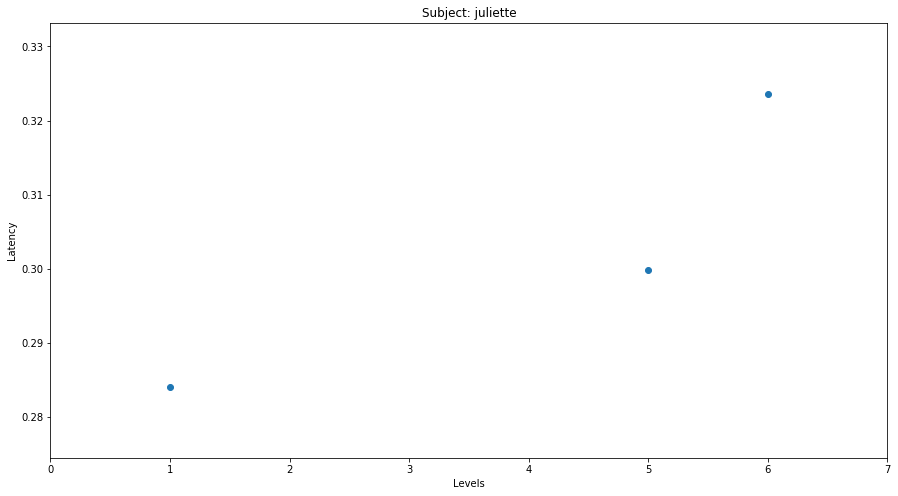

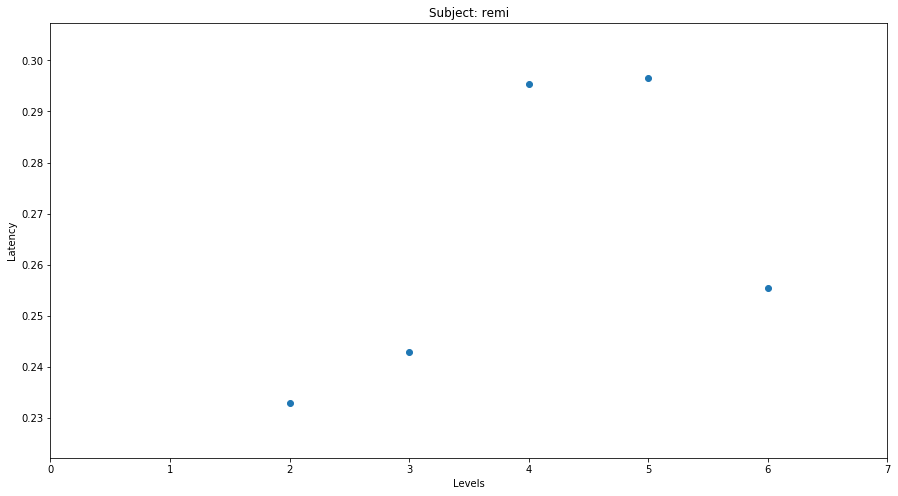

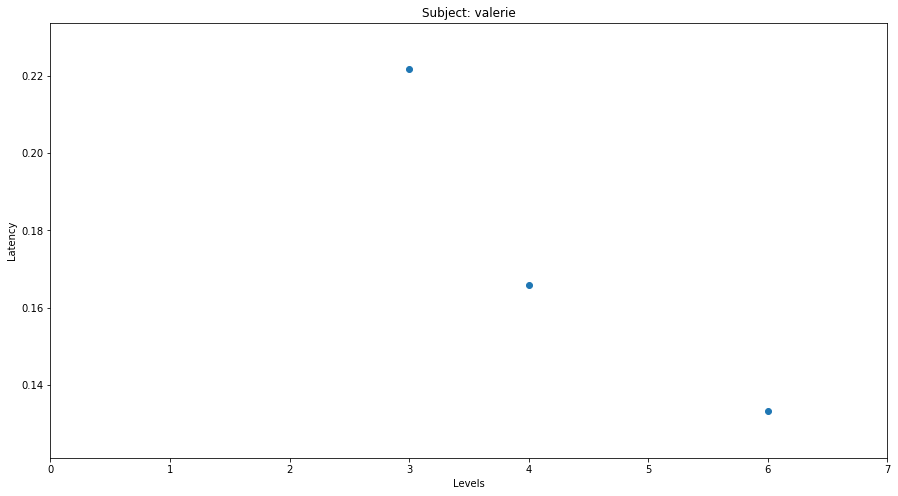

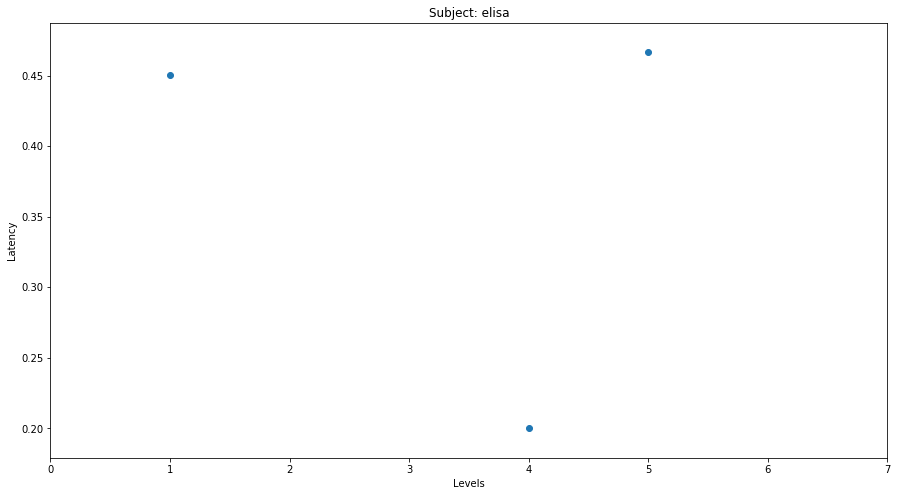

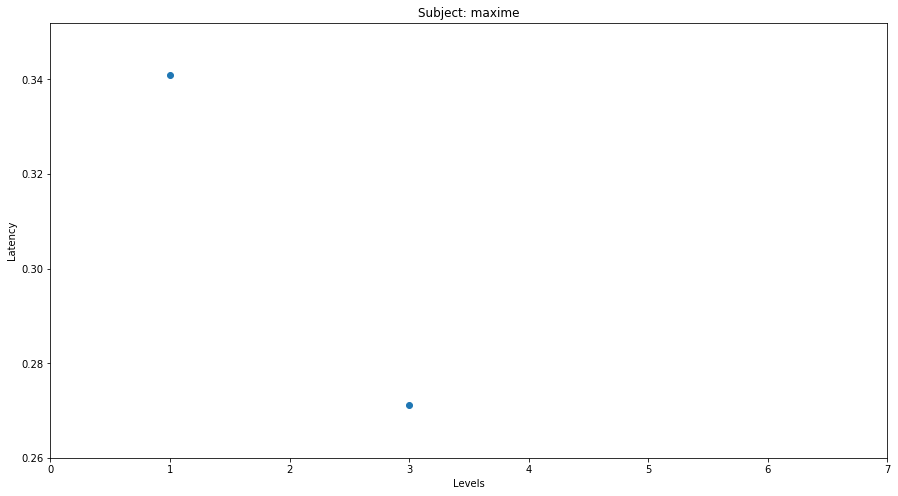

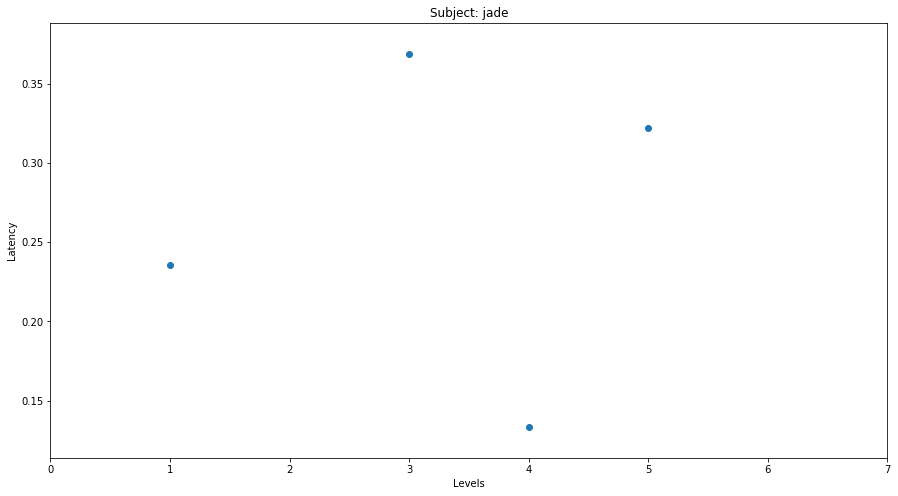

In [21]:
for subj in subjects:
    fig, ax = plt.subplots(figsize=(15,8))
    ax.scatter(lvl[subj], t_mean[subj])
    ax.set_title('Subject: ' + subj)
    ax.set_xlabel('Levels')
    ax.set_ylabel('Latency')
    ax.set_xlim(0, 7)

ValueError: x and y must be the same size

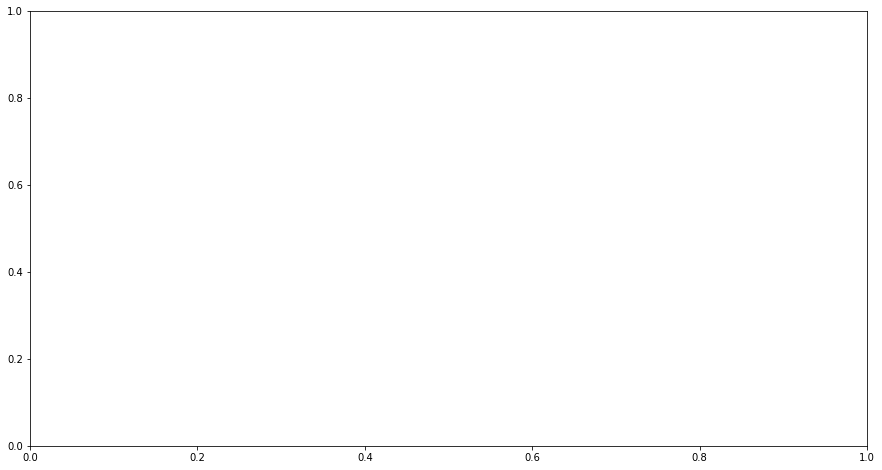

In [94]:
for subj in subjects:
    fig, ax = plt.subplots(figsize=(15,8))
    ax.scatter(p[subj], t_sacc[subj])
    ax.set_title('Subject: ' + subj)
    ax.set_xlabel('Levels')
    ax.set_ylabel('Latency')
    ax.set_xlim(0, 7)

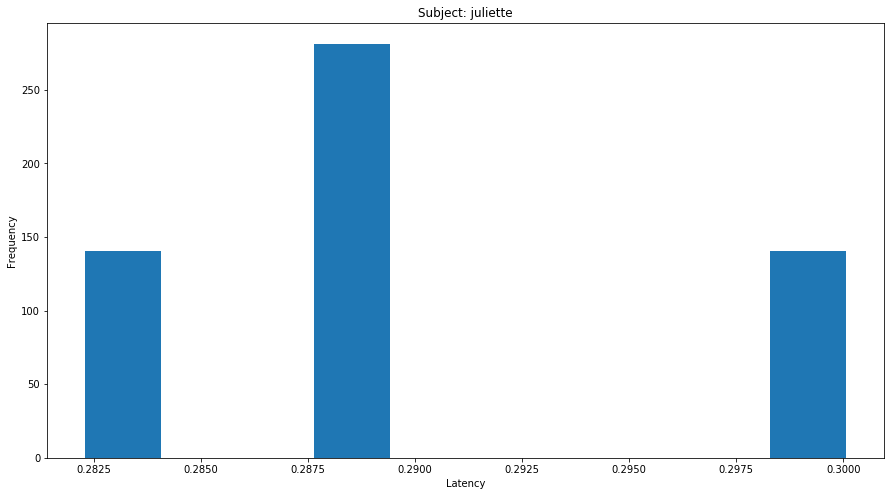

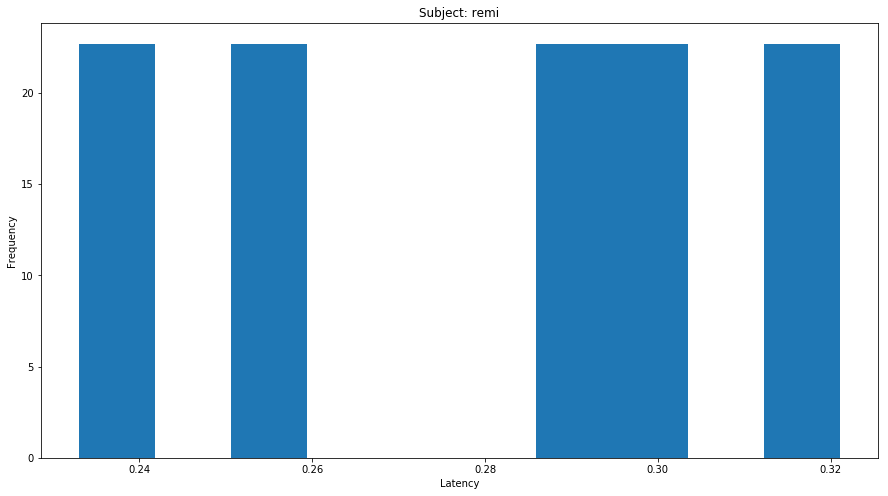

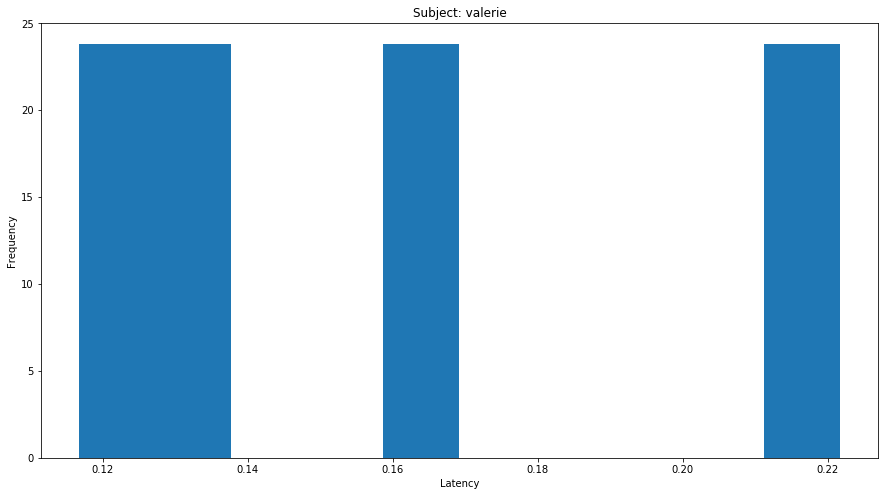

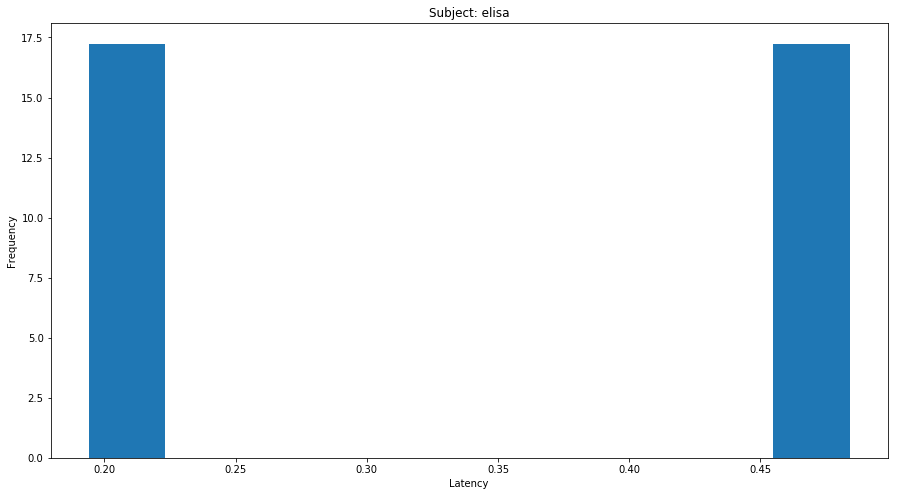

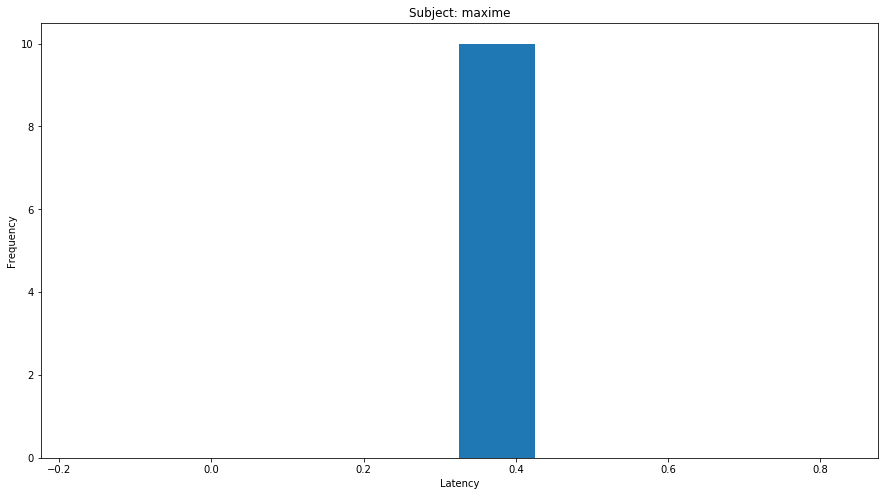

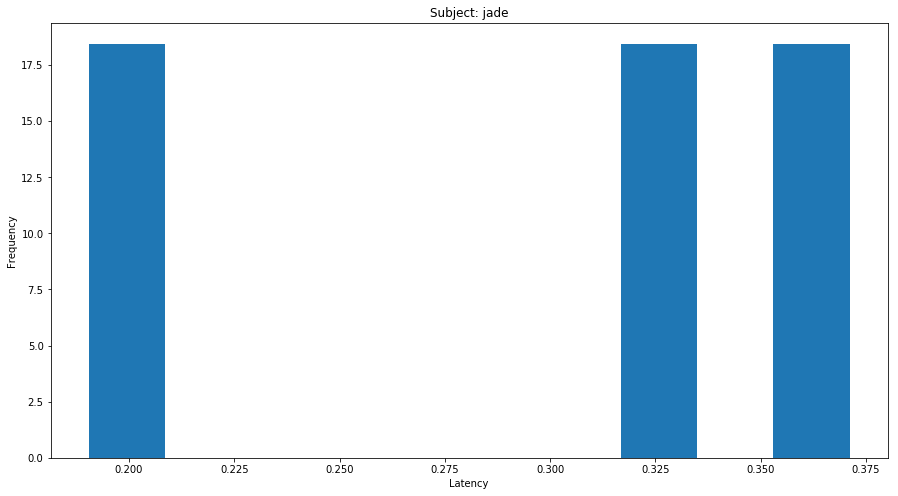

In [7]:
for subj in subjects:
    fig, ax = plt.subplots(figsize=(15,8))
    ax.hist(t_mean[subj], normed=True)
    ax.set_title('Subject: ' + subj)
    ax.set_xlabel('Latency')
    ax.set_ylabel('Frequency')

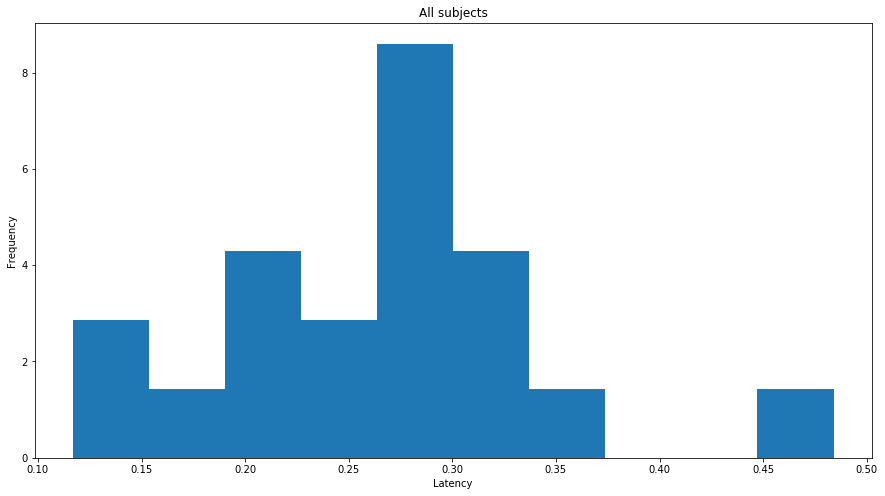

In [24]:
plt.figure(figsize=(15,8))
plt.hist(t_mean_, normed=True)
plt.title('All subjects')
plt.xlabel('Latency')
plt.ylabel('Frequency')

distribution des latences pour chaque niveau de p (+ paddle) - au debut pour chaque sujet


In [51]:
import configparser, ast
config = configparser.ConfigParser()
config.read(os.path.join('..', 'StochPong', 'config.ini'))
import_lvl = config['levels']
lvls_mix = ast.literal_eval(import_lvl['lvls'])
lvls_mono = ast.literal_eval(import_lvl['lvls_mono'])
lvls_mix

KeyError: 'experiment'

In [95]:
len(p[subj])

58

In [96]:
len(t_sacc[subj])

106